# DATA GENERATION OUTLINE

Data generation module and documentation is updated to include:

* genfranka.py -> **main module**

* genutil.py -> **preprocess & postprocess**

* randomenvs.py -> **domain randomization**

* controllers.py -> **control generation**

***
Module hierarchy is:
```
└── datageneration
    ├── {data_tensors} : .pt
    │   └── train
    │       ├── MG1
    │       ├── MG2
    │       ├── ...
    │       └── FineTune3
    │   └── test
    │       ├── T1
    │       ├── T2
    │       ├── ...
    ├       ├── Oneshot
    |       ├── Fewshot
    │       └── TOSC
    │
    ├── {data_objects} : .json
    │   ├── MG1
    │   ├── MG2
    │   ├── ...
    │   └── FineTune3
    |
    ├── {plots} : .png  
    │   ├── aux
    │   ├── MG1
    │   ├── ...
    │   └── FineTune3
    |
    ├── {logs} : .txt
    │   ├── aux
    │   ├── MG1
    │   ├── ...
    │   └── FineTune3
    |
    ├── {datageneration_modules} : .py
    │   └── defaults
```
***

***
Datasets are:
```
└── datasets
    ├── train
    |   ├── MG1: sin, chirp; no randomization; f[0.1]
    |   ├── MG2: all randomization 10%
    |   ├── MG3: increased frequency range f[0.05 - 0.4]
    |   ├── MG4: include saturated environments
    |   ├── MG5: 6D orientation
    |   ├── MGOSC: VS, FS, FC; no randomization
    |   └── FineTune3
    |   ...
    |   ├── LG1: best of MGs
    |   └── LG2: best of MGs
    |   ...
    |   ├── FineTune1: frequency tuning
    |   ├── FineTune2: task specific tuning
    |   └── FineTune3: osc tuning
    |
    ├── test
    |   ├── T1: distribution score ~ 10
    |   ├── T2: distribution score ~ 5
    |   ├── T3: distribution score ~ 1
    |   ├── T4: unseen math tasks - trapz & impuls
    |   ├── Oneshot: 2000 iterations long dataset
    |   ├── Fewshot: 5000-15000 iterations long dataset
    |   └── TOSC: osc tasks
```
***

All documentation is provided in README.md... 

further information in (https://github.com/Gunesnes/Diffusion-Models-for-System-Identification)

datasets in (https://polimi365-my.sharepoint.com/my?id=%2Fpersonal%2F10903989%5Fpolimi%5Fit%2FDocuments%2Fdatasets)


In [2]:
from isaacgym import gymapi
from isaacgym import gymutil
from isaacgym import gymtorch
from isaacgym.torch_utils import *
from genutil import *
from controllers import action, osc, compensate
from randomenvs import envinit
import math
import numpy as np
import torch

import os
from pathlib import Path
import time
import sys

torch.cuda.empty_cache()

Importing module 'gym_38' (/home/gunes/isaacgym/tfm/RoboMorph/data_generation/isaacgym/_bindings/linux-x86_64/gym_38.so)
Setting GYM_USD_PLUG_INFO_PATH to /home/gunes/isaacgym/tfm/RoboMorph/data_generation/isaacgym/_bindings/linux-x86_64/usd/plugInfo.json
PyTorch version 2.0.1
Device count 1
/home/gunes/isaacgym/tfm/RoboMorph/data_generation/isaacgym/_bindings/src/gymtorch


Using /home/gunes/.cache/torch_extensions/py38_cu117 as PyTorch extensions root...
Emitting ninja build file /home/gunes/.cache/torch_extensions/py38_cu117/gymtorch/build.ninja...
Building extension module gymtorch...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)


ninja: no work to do.


Loading extension module gymtorch...


# ARGUMENT PARSING - NOVELTIES

User arguments are updated to include few novelties as:

***
* Randomization Arguments: **stiffness** - **damping** - **angular damping** - **coulomb damping** - **mass** - **com** - **inertia** - **oscgains** - **random pos** - **random vel**

* Include Saturated Environments

* Fix Quarternion Error During Runtime

* Higher/Lower Order Orientation Vectors - **3D/4D/6D**

* Ground Truth Measurements - **torque** - **friction** - **damping**

* No Gravity Compensation

* No Friction Compensation
***

In [2]:
sys.argv = ['','-ne=32', '-ni=1000', '-f=0.1', '-c', '-ti=MS', '-td=train', '-nd=trial', '-hdo=6D', '-ri', '-rv', '-rm=10', '-rcom=10', '-rinr=10', '-rstf=10', '-rdam=10', '-rcf=10', '-s=42', '-mf', '-mgf', '-is', '-fq']
args = parser(description="FrankaDataGen",params=[]).parse_arguments()
data = reader(path='data.json').read_data()


Generation MetaData from: data.json
Data stored in dict


In [3]:
TOTAL_COORDS = data["TOTAL_COORDS"]
TOTAL_JOINTS = data["TOTAL_JOINTS"]
TOTAL_LINKS = data["TOTAL_LINKS"]

POS_END = np.array(data["POS_END"])
VEL_END = np.array(data["VEL_END"])
ACC_END = np.array(data["ACC_END"])
JER_END = np.array(data["JER_END"])
TOR_END = np.array(data["TOR_END"])
TAC_END = np.array(data["TAC_END"])
FRICTION = np.array(data["FRICTION"])
GRAVITY = data["GRAVITY"]

COULOMB_NOM = np.array(data["COULOMB_NOM"])
ANGDAMP_NOM = float(data["ANGDAMP_NOM"])
MASS_NOM = np.array(data["MASS_NOM"])
COM_NOM = np.array(data["COM_NOM"])
INERTIA_NOM = np.array(data["INERTIA_NOM"])
STIFFNESS_NOM = np.array(data["STIFFNESS_NOM"])
DAMPING_NOM = np.array(data["DAMPING_NOM"])
OSC_NOM = np.array(data["OSC_NOM"])

SOLVER_TIME = data["SOLVER_TIME"]/60
SUBSTEPS = data["SUBSTEPS"]
SOLVER_TYPE = data["SOLVER_TYPE"]
NUM_POS_ITER = data["NUM_POS_ITER"]
NUM_VEL_ITER = data["NUM_VEL_ITER"]

FIX_BASE_LINK = data["FIX_BASE_LINK"]
FLIP_VISUAL_ATTACHMENTS = data["FLIP_VISUAL_ATTACHMENTS"]
ARMATURE = data["ARMATURE"]

DISABLE_GRAVITY = args.disable_gravity     
DISABLE_FRICTION = args.disable_friction          
CONTROL_IMPOSED = args.control_imposed                                           
OSC_TASK = args.osc_task                                          
TYPE_OF_OSC = args.type_of_osc                            
INCLUDE_SATURATION = args.include_saturation 
FIX_QUARTERNIONS = args.fix_quarternions
ORIENTATION_DIMENSION = args.orientation_dimension     

RANDOM_INIT_POS = args.random_initial_positions
RANDOM_INIT_VEL = args.random_initial_velocities        
RANDOM_MASS = float(args.random_masses)
RANDOM_INERTIA = float(args.random_inertias)
RANDOM_COM = float(args.random_coms)
RANDOM_STIFF = float(args.random_stiffness)
RANDOM_DAMP = float(args.random_damping)
RANDOM_COULOMB = float(args.random_coulomb_friction)
RANDOM_ANGDAMP = float(args.random_angular_damping)
RANDOM_KP_KV = args.random_osc_gains                              

INPUT_TYPE = args.type_of_input                          

VISUALIZE = args.visualize  
MEASURE = args.measure_force
HOLDFG = args.measure_gravity_friction                          
NOSAVE = args.no_save
NOPLOT = args.no_plot
DYNAMICAL_INCLUSION = args.dynamical_inclusion       
TYPE_OF_DATASET = args.type_of_dataset
NAME_OF_DATASET = args.name_of_dataset                          
FREQUENCY = args.frequency                                        
NUM_ENVS = args.num_envs                                          
NUM_RUNS = args.num_runs                                    
MAX_ITER = args.num_iters

NUM_THREADS = args.num_threads
USE_GPU = args.use_gpu
USE_GPU_PIPELINE = args.use_gpu_pipeline
COMPUTE_DEVICE_ID = args.compute_device_id
GRAPHICS_DECIDE_ID = args.graphics_device_id
PHYS_ENGINE = args.physics_engine
SEED = args.seed

complementary_dataset = 'train' if TYPE_OF_DATASET == 'test' else 'test'

output_folder = Path("./data_tensors/")
output_folder.mkdir(exist_ok=True)

current_folder = Path(f"./data_tensors/{TYPE_OF_DATASET}/{NAME_OF_DATASET}")
current_folder.mkdir(exist_ok=True)

complementary_folder = Path(f"./data_tensors/{complementary_dataset}/{NAME_OF_DATASET}")
complementary_folder.mkdir(exist_ok=True)

if not SEED:
    generated_seed = np.random.randint(0,999999)
    copies = True
    while copies:    
        list_of_tensors = os.listdir(f"./data_tensors/{complementary_dataset}/{NAME_OF_DATASET}")
        generated_seed_str = 'seed_'+str(generated_seed)
        if any(generated_seed_str in s for s in list_of_tensors):
            generated_seed = np.random.randint(0,999999)
            print("\nCurrent Folder: "+TYPE_OF_DATASET+" --> Found the same seed in "+complementary_dataset)
            print("\nGenerated seed:"+str(generated_seed)) 
        else:
            copies=False
else:
    generated_seed = SEED
print("\nGenerated Seed: "+str(generated_seed))
torch.manual_seed(generated_seed) 


Generated Seed: 42


# DOMAIN RANDOMIZATION

Domain randomization is updated as:

***
* Initial Position: **pos_min | pos_max**

* Initial Velocity  **0 | 0.1*vel_max**

* Link Masses: from https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8772145, around **link_mass_nom** - end links ignored, **max 10%**

* Link CoMs: from https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8772145, around **link_com_nom** - end links ignored, **max 10%**

* Link Inertias: from https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8772145, around **link_inertia_nom** - end links ignored, **max 10%**

* Controller Stiffness: around **stiffness_nom=0**, **max 10%**

* Controller Damping: around **damping_nom=10**, **max 10%**

* Angular Environment Damping: **0.5**, **max 10%**

* Coulomb Damping: around **0.001**, **max 10%**

* OSC Controller Gains: around  **kp_nom=10, kv_nom=6.666**, **max 10%**
***

1) **Initial Position** and **Initial Velocity** could both be imposed for increased randomization

2) **Link props** are acquired from the identification paper, missing values for extended links are assigned the gym default value. This assignment doesnt effect the generation process since the extended links are dynamically insignificant

3) **Angular Environment Damping** is inherent to the simulation and fixed to 0.5

4) **Coulomb Friction** is a useful method in imposing **velocity independent** losses, the isaacgym implementation of dof_friction, which corresponds to coulomb friction in our API is:
$$
F_{coulomb} = \frac{u_{loss}}{u_{imposed}}
$$
$$
u_{loss} = F_{coulomb} * u_{imposed}
$$
>   Since **friction** is scaled directly from the imposed control, the value should be minimal (around 0.001 for our purposes) or completely neglected. This type of friction could make the generation extremely reserved for higher values but prevents all sorts of **saturation, collision and quarternion errors**

5) **Controller Stiffness** and **Controller Damping** are useful methods in imposing **velocity dependent** losses, the isaacgym implementation of dof_damping, dof_stiffness, which corresponds to stiffness and damping in our API is:

$$
u_{imposed} = u_{actual} + K_{s} * (pos_{cur} - pos_{ss}) + K_{d} * (vel_{cur} - vel_{ss})
$$

>   Since Controller Stiffness and Controller Damping try to push the system to its** Steady State Value**, they should generally be avoided. 

> **Controller Stiffness** is particularly detrimental to all generational purposes since it completely nullifies all control effects after a transient period. 

> **Controller Damping** is helpful in eliminating **saturation, collision and quarternion errors** and attaining a more **robust simulation**, however, the internal computational implementation of controller damping is not known to the end user so it may not be safely stored in the imposed control function and **may drastically change** the training procedure.

***

All the randomization content is accessible through the data.json and randomenvs.py

References:

[1]     https://ieeexplore.ieee.org/ielx7/7083369/8764082/8772145/Supplementary_material.pdf?arnumber=8772145   

[2]     https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8772145

[3]     https://forums.developer.nvidia.com/t/torque-control-implementation/182378/22 

[4]     https://forums.developer.nvidia.com/t/possible-bug-in-joint-friction-value-definition/208631


In [4]:
gym = gymapi.acquire_gym()

TYPE_OF_CONTACT = gymapi.ContactCollection.CC_LAST_SUBSTEP 
sim_params = gymapi.SimParams()
sim_params.up_axis = gymapi.UP_AXIS_Z
sim_params.gravity = gymapi.Vec3(0.0, 0.0, -9.8)
sim_params.dt = SOLVER_TIME
sim_params.substeps = SUBSTEPS
if gymapi.SIM_PHYSX == PHYS_ENGINE:
    sim_params.physx.solver_type = SOLVER_TYPE
    sim_params.physx.num_position_iterations = NUM_POS_ITER
    sim_params.physx.num_velocity_iterations = NUM_VEL_ITER
    sim_params.physx.num_threads = NUM_THREADS
    sim_params.physx.use_gpu = USE_GPU
    sim_params.physx.contact_collection = TYPE_OF_CONTACT
else:
    raise Exception("Only PhysX is available")
sim_params.use_gpu_pipeline = USE_GPU_PIPELINE
sim = gym.create_sim(COMPUTE_DEVICE_ID, GRAPHICS_DECIDE_ID, PHYS_ENGINE, sim_params)
if sim is None:
    raise Exception("Failed to create sim")

plane_params = gymapi.PlaneParams()
plane_params.normal = gymapi.Vec3(0, 0, 1)
gym.add_ground(sim, plane_params)

num_per_row = int(math.sqrt(NUM_ENVS))
spacing = 1.0
env_lower = gymapi.Vec3(-spacing, -spacing, 0.0)
env_upper = gymapi.Vec3(spacing, spacing, spacing)

pose = gymapi.Transform()
pose.p = gymapi.Vec3(0, 0, 0)
pose.r = gymapi.Quat(0, 0, 0, 1)

ienv = envinit(args,
               gym, sim,
               env_lower, env_upper, num_per_row, pose,
               TOTAL_LINKS, TOTAL_JOINTS,
               FIX_BASE_LINK, FLIP_VISUAL_ATTACHMENTS, ARMATURE, DISABLE_GRAVITY, 
               ANGDAMP_NOM, MASS_NOM, COM_NOM, INERTIA_NOM, STIFFNESS_NOM, DAMPING_NOM, COULOMB_NOM,
               POS_END, VEL_END
               )
envdict = ienv.create_envs()

Not connected to PVD
+++ Using GPU PhysX
Physics Engine: PhysX
Physics Device: cuda:0
GPU Pipeline: enabled

 Mass randomization:
Lower bound -->
[4.5  4.47 0.58 2.91 3.23 1.1  1.5  0.66 0.65 0.02 0.02]
Higher bound -->
[5.5  5.47 0.71 3.55 3.95 1.35 1.83 0.81 0.79 0.02 0.02]

 CoM randomization:
Lower bound -->
[[-0.0318  0.0035 -0.0035  0.0248 -0.0585 -0.0131  0.0541  0.0095  0.
   0.     -0.    ]
 [-0.0009  0.0019 -0.0316  0.0353  0.094   0.037  -0.0155 -0.0047 -0.001
   0.0108 -0.0132]
 [ 0.0509 -0.1925  0.0031 -0.0732  0.0247 -0.0423 -0.0116  0.0554  0.0217
   0.0214  0.0214]]
Higher bound -->
[[-0.026   0.0043 -0.0028  0.0303 -0.0479 -0.0108  0.0662  0.0116  0.
   0.     -0.    ]
 [-0.0007  0.0023 -0.0258  0.0432  0.1149  0.0452 -0.0127 -0.0038 -0.0008
   0.0132 -0.0108]
 [ 0.0622 -0.1575  0.0038 -0.0599  0.0302 -0.0346 -0.0095  0.0678  0.0265
   0.0262  0.0262]]

 Inertia randomization:
Lower bound -->
[[ 8.200e-03  6.330e-01  7.200e-03  3.350e-02  2.330e-02  3.200e-02
   1.800e

# PREPROCESS SIMULATION

Apart from the usual **Jacobian**, **Mass** and **Dof-State** Tensors, **Measurement Tensors** are also added for benchmarking the simulation against isaacgym inherent control collection, **force sensors** are mounted on the simulation for this purpose / may result in increased overhead.
***
2 compensation methods are called seperately by user request on gravity and friction:

1) Gravity Compensation: from https://github.com/isaac-sim/IsaacGymEnvs

>   Gravity Compensation is directly dependant on link masses and jacobiands and highly influential on the imposed control torques


        g = torch.zeros(self.n_envs, self._dof+1, 6, 1, dtype=torch.float, device=self.device)
        g[:, :, 2, :] = 9.81
        g_force = self._link_mass.unsqueeze(-1).unsqueeze(-1) * g
        g_torque = (torch.transpose(self._j_link, 2, 3) @ g_force).squeeze(-1)
        g_torque = torch.sum(g_torque, dim=1, keepdim=False)

$$
u = u + g(x,v)
$$

2) Friction Compensation: from https://ieeexplore.ieee.org/ielx7/7083369/8764082/8772145/Supplementary_material.pdf?arnumber=8772145

>   Friction Compensation is in the form of viscous friction directly depending on dof_velocity of a given iteration and relatively minimal to the imposed control torques.

        vel = vel.contiguous().view(self.args.num_envs,self.num_joints,1).squeeze()
        self.fval = self.fp[:,0]/(1+torch.exp(-self.fp[:,1]*(vel+self.fp[:,2]))) - self.fp[:,0]/(1+torch.exp(-self.fp[:,1]*self.fp[:,2]))
        
$$
u = u + f(v)
$$

3) Control is imposed either mathematically in the form of **sinusoidal**, **chirp**, **trapezoidal** or **impulse** functions or through OSC control scheme with randomizable **kp** and **kv** controller gains. Control generation is relatively similar to before with a renewed API. The potentially most significant takeaway from the controller script is that the nominal frequency of the control action is a little higher always then it is intended since skewed lower and higher bounds definitions.

***

All the compensation and control generation content is accessible through controllers.py and are listed extensively for different parser arguments in the Appendix.

References:

[1]     https://ieeexplore.ieee.org/ielx7/7083369/8764082/8772145/Supplementary_material.pdf?arnumber=8772145   

[2]     https://github.com/isaac-sim/IsaacGymEnvs

In [5]:
gym.prepare_sim(sim)

init_pos = torch.Tensor(envdict["ipos"]).view(NUM_ENVS, 3).to(device=GRAPHICS_DECIDE_ID)
init_orn = torch.Tensor(envdict["iorn"]).view(NUM_ENVS, 4).to(device=GRAPHICS_DECIDE_ID)

if USE_GPU_PIPELINE:
    init_pos = init_pos.to('cuda:0')
    init_orn = init_orn.to('cuda:0')

pos_des = init_pos.clone()
orn_des = init_orn.clone()

_jacobian = gym.acquire_jacobian_tensor(sim, "franka")
jacobian = gymtorch.wrap_tensor(_jacobian)

hand_index = gym.get_asset_rigid_body_dict(envdict["fass"])["panda_hand"]
j_eef = jacobian[:, hand_index - 1, :]

_massmatrix = gym.acquire_mass_matrix_tensor(sim, "franka")
mm = gymtorch.wrap_tensor(_massmatrix)

_rb_states = gym.acquire_rigid_body_state_tensor(sim)
rb_states = gymtorch.wrap_tensor(_rb_states)

if MEASURE:
    _simtorques = gym.acquire_dof_force_tensor(sim)
    simtorques = gymtorch.wrap_tensor(_simtorques)

_contact_forces = gym.acquire_net_contact_force_tensor(sim) 
contact_forces = gymtorch.wrap_tensor(_contact_forces)

_dof_states = gym.acquire_dof_state_tensor(sim)
dof_states = gymtorch.wrap_tensor(_dof_states)
dof_vel = dof_states[:, 1].view(NUM_ENVS, 9, 1)
dof_pos = dof_states[:, 0].view(NUM_ENVS, 9, 1)
ll = torch.tensor(POS_END[:7,0]).repeat(NUM_ENVS,1).to(device=GRAPHICS_DECIDE_ID)  
ul = torch.tensor(POS_END[:7,1]).repeat(NUM_ENVS,1).to(device=GRAPHICS_DECIDE_ID)  
tl = torch.tensor(TOR_END[:7]).repeat(NUM_ENVS,1).to(device=GRAPHICS_DECIDE_ID) 

if CONTROL_IMPOSED:
    ct = action(num_envs=NUM_ENVS,
                num_iter=MAX_ITER+1, 
                num_joints=TOTAL_JOINTS, 
                num_coords=TOTAL_COORDS,
                frequency=FREQUENCY,
                input_type=INPUT_TYPE,
                mass_vector=envdict["mv"],
                args=args)
    cdict = ct.getcontrol()

elif OSC_TASK:
    cosc = osc(num_envs=NUM_ENVS,
                num_iter=MAX_ITER+1, 
                num_joints=TOTAL_JOINTS, 
                num_coords=TOTAL_COORDS,
                frequency=FREQUENCY,
                input_type=INPUT_TYPE,
                mass_vector=envdict["mv"],
                args=args)
    cdict = cosc.getcontrol()
    
if not DISABLE_FRICTION or not DISABLE_GRAVITY:
    comp = compensate(args=args,
                      gravity=GRAVITY,
                      friction_params=FRICTION,
                      num_joints=TOTAL_JOINTS)
    
black_list = []  
out_of_range_quaternion = [] 
saturated_ll_idxs = []
saturated_ul_idxs = []
mesh = gymapi.MESH_VISUAL_AND_COLLISION
color = gymapi.Vec3(.9,.25,.15)

Control Action is acquired with median frequency 0.10833333333333334

Compensating for gravitational losses - implementation on control action
Compensating for frictional losses - implementation on control action


# SIMULATION

Lots of new functionalities are included in the bulk of simulation script, most importantly:

***
1) disable gravity: disables gravity compensation
> gravity compensation is necessary for our purposes so skip for all practical purposes

        gforce = mass.squeeze(0)[:,1:].unsqueeze(-1).unsqueeze(-1) * self.g
        jlink = jacobian[:, :self.num_joints+1, :, :self.num_joints]
        gtorque_ = (torch.transpose(jlink, 2, 3) @ gforce).squeeze(-1)
        gtorque = torch.sum(gtorque_, dim=1, keepdim=False).unsqueeze(-1)
        return gtorque

2) disable friction: disables friction compensation
> friction compensation is not necessary, however could be beneficial for the model to learn a minimal velocity dependent viscous friction effect, also possible to exaggerate the effect of compensation?

        vel = vel.contiguous().view(self.args.num_envs,self.num_joints,1).squeeze()
        self.fval = self.fp[:,0]/(1+torch.exp(-self.fp[:,1]*(vel+self.fp[:,2]))) - self.fp[:,0]/(1+torch.exp(-self.fp[:,1]*self.fp[:,2]))
        return self.fval.unsqueeze(-1).float()

3) track gravity and friction (holdfg): tracks compensation values over iterations
> refer to postprocessing section and Appendix

        cdict["bg"] = torch.cat((cdict["bg"],gtorque),dim=2)
        cdict["bf"] = torch.cat((cdict["bf"],ftorque),dim=2)

4) solve for different orientation dimensions: explores different orientation resolutions from https://arxiv.org/pdf/2202.12555 and https://github.com/thohemp/6DRepNet
> different orientation schemes could be much more efficient in training with neural networks and could alleviate our previous concerns in training and testing. 
> 3D -> Euler Angles
> 4D -> Quarternions (default)
> 6D -> higher dimensional projection of quarternions from https://arxiv.org/pdf/2202.12555

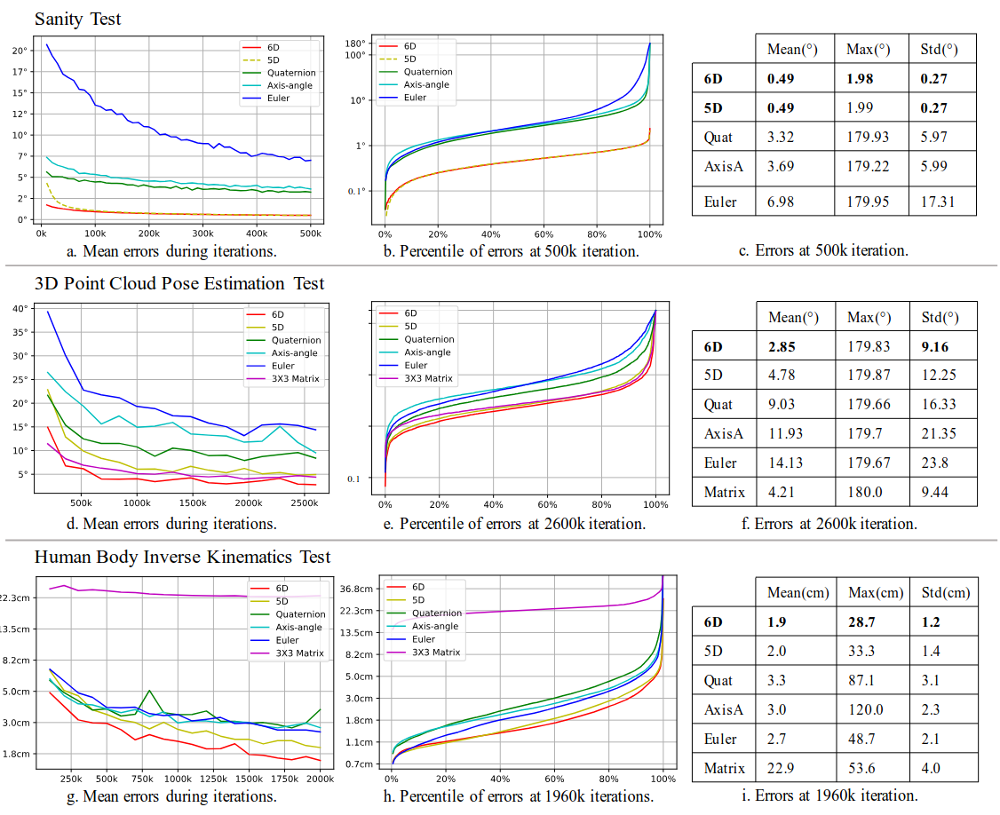

        r, i, j, k = torch.unbind(orn, -1)
        two_s = 2.0 / (orn * orn).sum(-1)
        o = torch.stack(
            (
                1 -two_s * (j * j + k * k),
                two_s * (i * j - k * r),
                two_s * (i * k + j * r),
                two_s * (i * j + k * r),
                1 -two_s * (i * i + k * k),
                two_s * (j * k - i * r),
                two_s * (j * k - j * r),    
                two_s * (j * k + i * r),
                1 -two_s * (i * i + j * j)
            ),
            -1,
        )
        return o.reshape(orn.shape[:-1] + (3,3))

5) fix quarternion errors:
> quarternion errors can be fixed during runtime with the knowledge that quarternion shift occurs during an x-axis crossover of the 4th quarternion, this fact is used to shift the sign of the respective environment's quarternion values if certain checks are satisfied

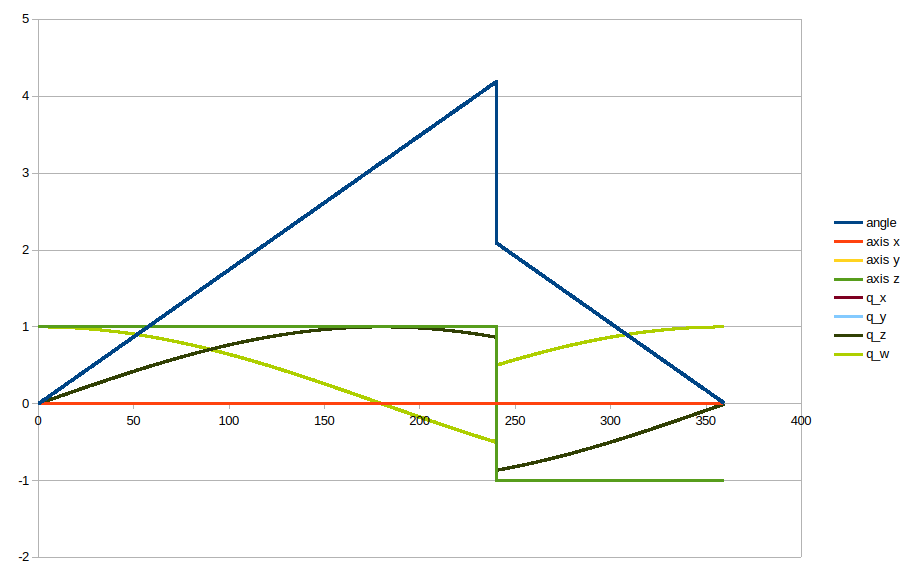

    cdict["bp"][itr-1,x[0],x[1]+3] = cdict["bp"][itr-1,x[0],x[1]+3]*-1
    rb_states[envdict["hidx"][x[0]], x[1]+3] = -1*rb_states[envdict["hidx"][x[0]], x[1]+3]

6) include position saturation: maximum domain exploration, additional nonlinearities
>
        if CONTROL_IMPOSED and not INCLUDE_SATURATION:
            saturation_ll = torch.nonzero(abs(dof_pos-ll) < 0.01)
            saturation_ul = torch.nonzero(abs(dof_pos-ul) < 0.01)

        if saturation_ll.shape[0] != 0:
            for j in range(saturation_ll.shape[0]):
                saturated_ll_idxs.append(saturation_ll[j,1])

        if saturation_ul.shape[0] != 0:
            for j in range(saturation_ul.shape[0]):
                saturated_ul_idxs.append(saturation_ul[j,1])

7) include torque saturations: maximum domain exploration, additional nonlinearities
>
        if OSC_TASK and not INCLUDE_SATURATION:
        saturation_torques = torch.nonzero( (tl - abs(u.squeeze(-1)[:,:7]) ) < 1)
        if saturation_torques.shape[0] != 0:
            for j in range(saturation_torques.shape[0]):
                saturated_ul_idxs.append(saturation_torques[j,0])
                env_handlet = gym.get_env(sim,saturated_ul_idxs[j])
                if VISUALIZE:    
                    for k in range(TOTAL_LINKS):
                        gym.set_rigid_body_color(env_handlet, envdict["hdls"][0], k , mesh ,color) 

8) measure torques: isaacgym internal method with torque sensors
> refer to postprocessing section and Appendix
    
        if MEASURE:
            _simtorques = gym.acquire_dof_force_tensor(sim)
            simtorques = gymtorch.wrap_tensor(_simtorques)
        simtorques = gymtorch.wrap_tensor(_simtorques).view(1,NUM_ENVS,9)
        cdict["mt"] = torch.cat((cdict["mt"],simtorques),0)
***

References:

[1]     https://arxiv.org/pdf/2202.12555

[2]     https://arxiv.org/abs/1812.07035

[3]     https://github.com/thohemp/6DRepNet

[4]     https://forum.freecad.org/viewtopic.php?t=85552

In [6]:
if VISUALIZE:
    viewer = gym.create_viewer(sim, gymapi.CameraProperties())
    if viewer is None:
        raise Exception("Failed to create viewer")
    cam_pos = gymapi.Vec3(4, 4, 4)
    cam_target = gymapi.Vec3(-4, -3, -2)
    middle_env = envdict["envs"][NUM_ENVS // 2 + num_per_row // 2]
    gym.viewer_camera_look_at(viewer, middle_env, cam_pos, cam_target)
    condition_window = gym.query_viewer_has_closed(viewer)
else:
    condition_window = 0 

itr = 0
ts = time.perf_counter()

while not condition_window  and itr <= MAX_ITER-1:
    itr += 1

    gym.refresh_rigid_body_state_tensor(sim)
    gym.refresh_dof_state_tensor(sim)
    gym.refresh_jacobian_tensors(sim)
    if MEASURE:
        gym.refresh_dof_force_tensor(sim)
    gym.refresh_mass_matrix_tensors(sim)
    gym.refresh_net_contact_force_tensor(sim) 

    pos_cur = rb_states[envdict["hidx"], :3]
    orn_cur = rb_states[envdict["hidx"], 3:7]

    if OSC_TASK:
        u = cosc.step_osc(pos_des,orn_des,pos_cur,dof_vel,orn_cur,init_pos,j_eef,mm,itr)
        cdict["bt"] = torch.cat((cdict["bt"], pos_des.to("cpu").view( 1,NUM_ENVS, 3)), 0)
    elif CONTROL_IMPOSED:
        u = cdict["ac"][:,:,itr].unsqueeze(-1)

    if not DISABLE_GRAVITY:
        gtorque = comp.gravity(jacobian,envdict["mv"])
        u = u + gtorque
    if not DISABLE_FRICTION:
        ftorque = comp.friction(dof_vel)
        u = u + ftorque
    if HOLDFG:
        cdict["bg"] = torch.cat((cdict["bg"],gtorque),dim=2)
        cdict["bf"] = torch.cat((cdict["bf"],ftorque),dim=2)

    # -------------------------------------- Application of u ---------------------------------------------
    gym.set_dof_actuation_force_tensor(sim, gymtorch.unwrap_tensor(u))        
                
    # -------------------------------------- Step the physics ---------------------------------------------
    gym.simulate(sim)
    gym.fetch_results(sim, True)
    if VISUALIZE:
        gym.step_graphics(sim)
        gym.draw_viewer(viewer, sim, False)
        gym.sync_frame_time(sim)

    # --------------------------------------- Buffer Stack ------------------------------------------------
    if OSC_TASK:
        uaug = u
        cdict["bca"] = torch.cat((cdict["bca"], uaug), 2)
    elif CONTROL_IMPOSED:
        uaug = u.view(1,NUM_ENVS,9)[:,:,:TOTAL_JOINTS]
        cdict["bca"] = torch.cat((cdict["bca"], uaug), 0)

    dof_states = gymtorch.wrap_tensor(_dof_states) # Remove?
    dof_pos = dof_states[:, 0]
    dof_vel = dof_states[:, 1]

    dof_pos = dof_pos.view(1,NUM_ENVS,9)
    dof_pos = dof_pos[:,:,:7]
    dof_vel = dof_vel.view(1,NUM_ENVS,9)

    pos_cur = pos_cur.view(1,NUM_ENVS,3)
    orn_cur = decide_orientation(orn_cur.view(1,NUM_ENVS,4),ORIENTATION_DIMENSION)

    # -------------------------- Including dof_pos for 7 - dimension state space ---------------------------
    full_pose = torch.cat((pos_cur,orn_cur,dof_pos),dim = 2)
    cdict["bp"] = torch.cat((cdict["bp"], full_pose), 0)
    #cdict["bv"] = torch.cat((cdict["bv"], dof_vel), 0)        

    # ------------------------------------- Contact Collection ---------------------------------------------
    body_contact = torch.nonzero(abs(contact_forces)>0.01)

    for j in range(body_contact.shape[0]):
        _body_contact = body_contact[j]
        env_idx_collision = torch.ceil(_body_contact[0]/TOTAL_LINKS)-1
        if  not env_idx_collision in black_list : 
            black_list.append(env_idx_collision)
            env_handlec = gym.get_env(sim,env_idx_collision)
            if VISUALIZE:    
                for k in range(TOTAL_LINKS):
                    gym.set_rigid_body_color(env_handlec, envdict["hdls"][0], k , mesh ,color) 

    # ---------------------------------- Abnormal change in quaternion -------------------------------------
    if itr > 2 and ORIENTATION_DIMENSION=='4D':
        increment = abs(cdict["bp"][itr-1,:,3:7] - cdict["bp"][itr-2,:,3:7])
        out_of_range = torch.nonzero(increment > .1)
        if out_of_range.numel()!=0: 
            for x in out_of_range:
                out_of_range_quaternion.append(x[0])
                if FIX_QUARTERNIONS:
                    cdict["bp"][itr-1,x[0],x[1]+3] = cdict["bp"][itr-1,x[0],x[1]+3]*-1
                    rb_states[envdict["hidx"][x[0]], x[1]+3] = -1*rb_states[envdict["hidx"][x[0]], x[1]+3]

    # ---------------------------------- Saturation check | Position ---------------------------------------
    if CONTROL_IMPOSED and not INCLUDE_SATURATION:
        saturation_ll = torch.nonzero(abs(dof_pos-ll) < 0.01)
        saturation_ul = torch.nonzero(abs(dof_pos-ul) < 0.01)

        if saturation_ll.shape[0] != 0:
            for j in range(saturation_ll.shape[0]):
                saturated_ll_idxs.append(saturation_ll[j,1])

        if saturation_ul.shape[0] != 0:
            for j in range(saturation_ul.shape[0]):
                saturated_ul_idxs.append(saturation_ul[j,1])

    # ---------------------------------- Saturation check | Torque -----------------------------------------
    if OSC_TASK and not INCLUDE_SATURATION:
        saturation_torques = torch.nonzero( (tl - abs(u.squeeze(-1)[:,:7]) ) < 1)
        if saturation_torques.shape[0] != 0:
            for j in range(saturation_torques.shape[0]):
                saturated_ul_idxs.append(saturation_torques[j,0])
                env_handlet = gym.get_env(sim,saturated_ul_idxs[j])
                if VISUALIZE:    
                    for k in range(TOTAL_LINKS):
                        gym.set_rigid_body_color(env_handlet, envdict["hdls"][0], k , mesh ,color) 

    # -------------------------------- Sensor Measurement - Ground Truth -----------------------------------
    if MEASURE:
        simtorques = gymtorch.wrap_tensor(_simtorques).view(1,NUM_ENVS,9)
        cdict["mt"] = torch.cat((cdict["mt"],simtorques),0)


tf = time.perf_counter()
dt = tf-ts
print(f"Time taken for simulation is {dt}")
if VISUALIZE:
    gym.destroy_viewer(viewer)
gym.destroy_sim(sim)

print(torch.cuda.max_memory_allocated()/8/1e6)
print(torch.cuda.max_memory_reserved()/8/1e6)
print(torch.cuda.memory_usage())
print(torch.cuda.memory_summary())

torch.cuda.empty_cache()


Time taken for simulation is 3.1321067200042307
2.492032
3.93216
14
|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |  16276 KiB |  19469 KiB |   3465 MiB |   3449 MiB |
|       from large pool |  16245 KiB |  19438 KiB |   1307 MiB |   1291 MiB |
|       from small pool |     31 KiB |   5151 KiB |   2157 MiB |   2157 MiB |
|---------------------------------------------------------------------------|
| Active memory         |  16276 KiB |  19469 KiB |   3465 MiB |   3449 Mi

# POSTPROCESS FOR SIMULATION

Specific improvements over the previous data generation process are listed and plotted below. For a more detailed rundown refer to the Appendix.
***
1) ground truth control

2) benchmark error

3) imposed control

4) saturation histograms

5) collision histograms

6) friction compensation measurement

7) gravity compensation measurement

8) 13/14/16D pose
***

In [7]:
if not INCLUDE_SATURATION:
    saturation_idxs = list(set([int(su.to("cpu").numpy()) for su in saturated_ul_idxs] +
                                [int(sl.to("cpu").numpy()) for sl in saturated_ll_idxs]))
    print("\n---- Number of saturated simulations: ",len(saturation_idxs),"/", NUM_ENVS,"----\n" )    
else:
    saturation_idxs = []
    print("Saturated environments are included in the final dataset\n")

if not FIX_QUARTERNIONS or not ORIENTATION_DIMENSION=='6D' or not ORIENTATION_DIMENSION=='3D':
    out_of_range_quaternion = list(set([int(q.to("cpu").numpy()) for q in out_of_range_quaternion]))
    print("---- Number of simulations with abnormal changes in quaternions: ",len(out_of_range_quaternion),"/", NUM_ENVS,"----\n" )
else:
    out_of_range_quaternion = []
    print("Quarternion error is manually compensated")


print("---- Number of the colliding simulations: ",len(black_list),"/", NUM_ENVS,"----\n" ) 

black_list = list(set([int(b.to("cpu").numpy()) for b in black_list] + out_of_range_quaternion + saturation_idxs))
white_list = set([i for i in range(NUM_ENVS)]) - set(black_list)
failed_percentage = len(black_list)/NUM_ENVS*100
print("\n---- Number of rejectable simulations: ",len(black_list),"/", NUM_ENVS,"----\n" )  
print("Percentage of total rejectable simulations:", round(failed_percentage,2), "%") 

non_valid_envs = len(black_list)
num_valid_envs = NUM_ENVS - non_valid_envs

black_list.sort(reverse=True)
ll = ll[list(white_list),:]
ul = ul[list(white_list),:]

if DYNAMICAL_INCLUSION:
    envdict["mv"] = envdict["mv"][:,list(white_list),:]

for i in range(non_valid_envs):
    row_exclude = black_list[i]

    if CONTROL_IMPOSED:
        cdict["bca"] = torch.cat((cdict["bca"] [:,:row_exclude,:],
                            cdict["bca"] [:,row_exclude+1:,:]),1)
        cdict["bp"] = torch.cat((cdict["bp"] [:,:row_exclude,:],
                            cdict["bp"] [:,row_exclude+1:,:]),1)
        if MEASURE:
            cdict["mt"] = torch.cat((cdict["mt"] [:,:row_exclude,:],
                            cdict["mt"] [:,row_exclude+1:,:]),1)    
    elif OSC_TASK:
        cdict["bca"] = torch.cat((cdict["bca"] [:row_exclude,:,:],
                            cdict["bca"] [row_exclude+1:,:,:]),0)
        cdict["bt"] = torch.cat((cdict["bp"] [:,:row_exclude,:],
                            cdict["bp"] [:,row_exclude+1:,:]),1)
    
        cdict["bp"] = torch.cat((cdict["bp"] [:,:row_exclude,:],
                            cdict["bp"] [:,row_exclude+1:,:]),1)
        if MEASURE:
            cdict["mt"] = torch.cat((cdict["mt"] [:,:row_exclude,:],
                            cdict["mt"] [:,row_exclude+1:,:]),1)   
            
if MEASURE:
    cdiff = cdict["bca"][:,:,:9] + cdict["mt"]        

Saturated environments are included in the final dataset

---- Number of simulations with abnormal changes in quaternions:  0 / 32 ----

---- Number of the colliding simulations:  0 / 32 ----


---- Number of rejectable simulations:  0 / 32 ----

Percentage of total rejectable simulations: 0.0 %


In [8]:
if not NOSAVE:
    tensormgmt = savedata(args,
                        control_trajectory=cdict["bca"],
                        pose=cdict["bp"],
                        seed=generated_seed,
                        valid_envs=num_valid_envs,
                        target=cdict["bt"],
                        dynamical_inclusion=envdict["mv"],
                        collision=None,
                        gentime=dt,
                        path='.')
    tensormgmt.save_tensors()
    tensormgmt.save_metadata()
else:
    print("Input/Output Tensors are not saved")


Saving tensor input/output data
Control Dimension:torch.Size([1001, 32, 9])
Pose Dimension:torch.Size([1000, 32, 16])
Target Dimension:None
Dynamical Inclusion Dimension:torch.Size([1, 32, 11])

Simulation to be saved as:
 42_32_1000_01_G_F_P_V_10_10_10_10_10_10_0_NOSC_Q_S_6D_MS__train

Dataset saved with the above namespace



 Ready to Post-Process


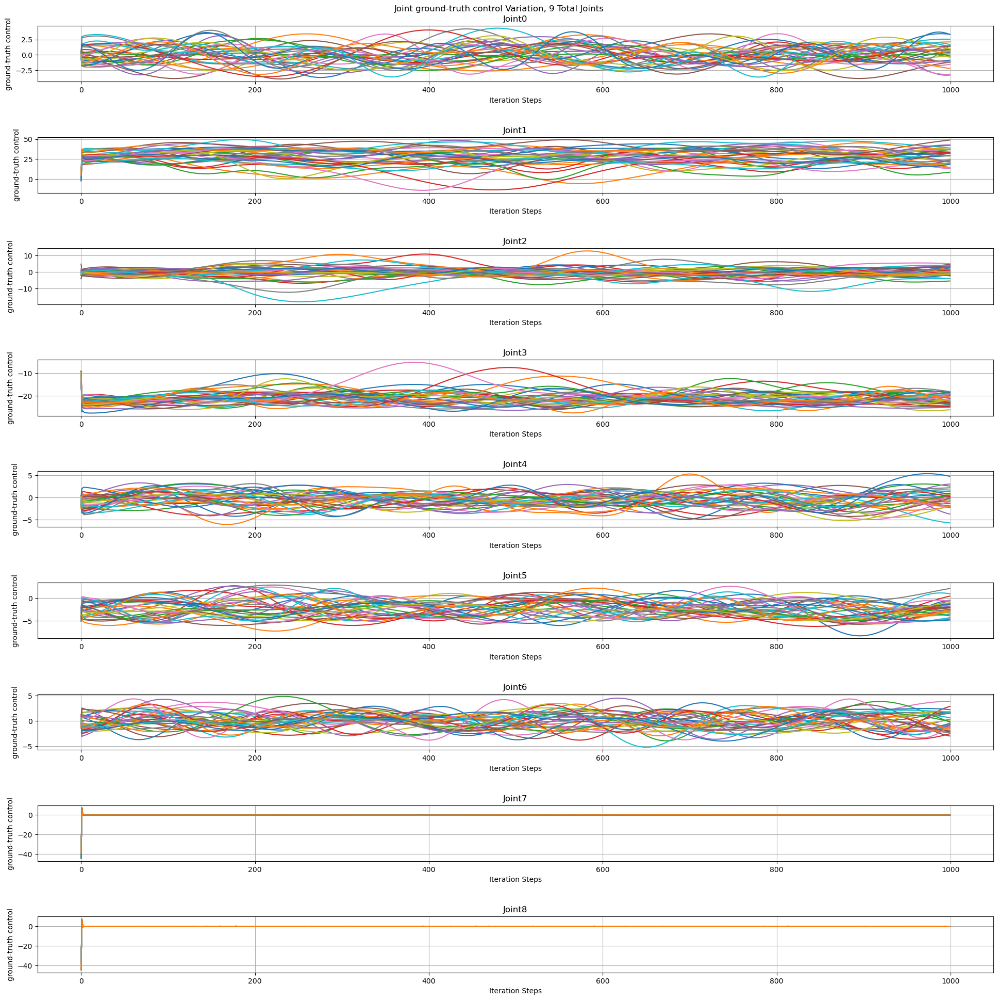

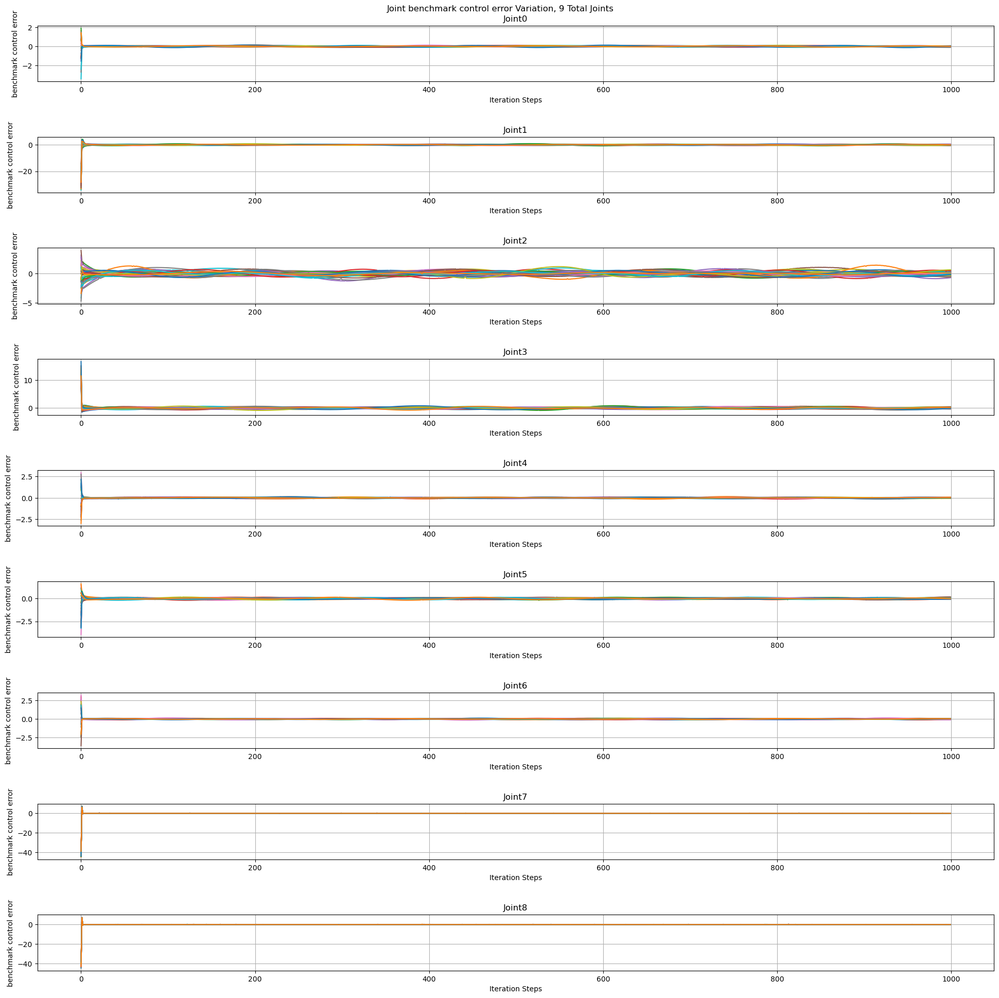

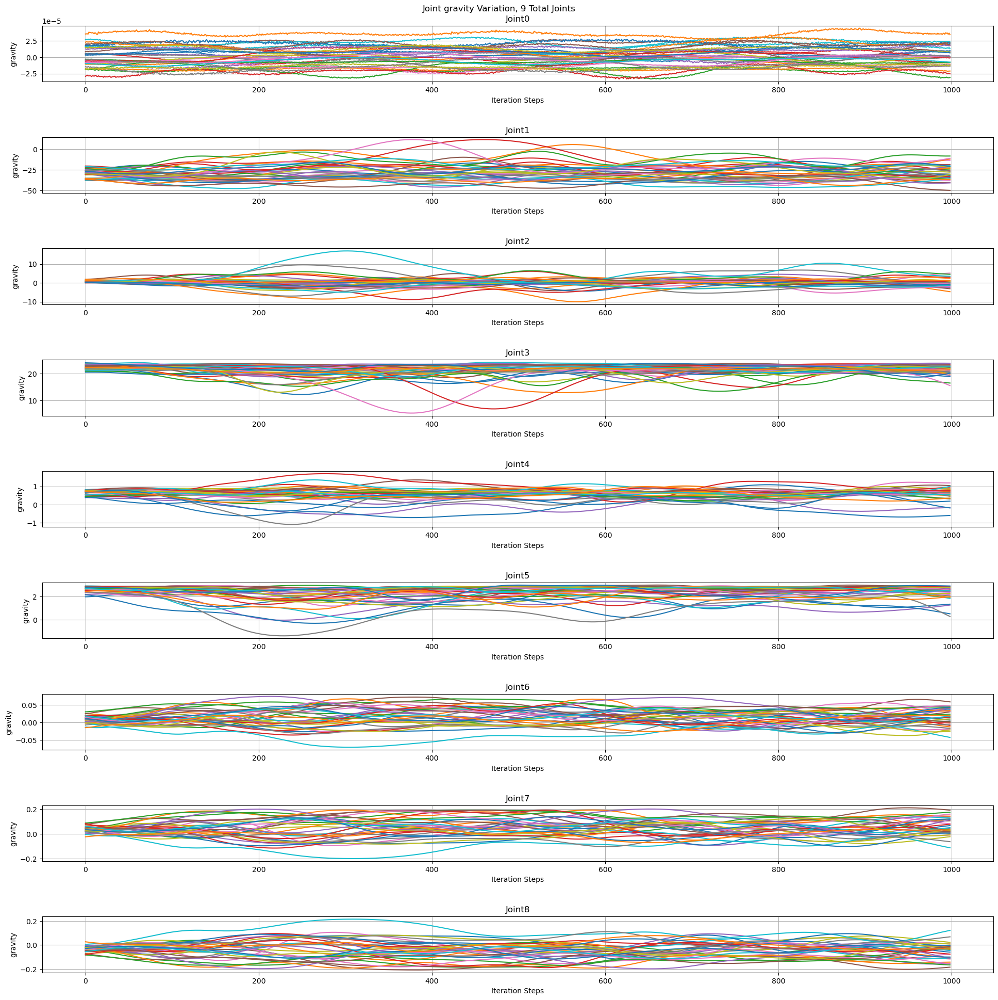

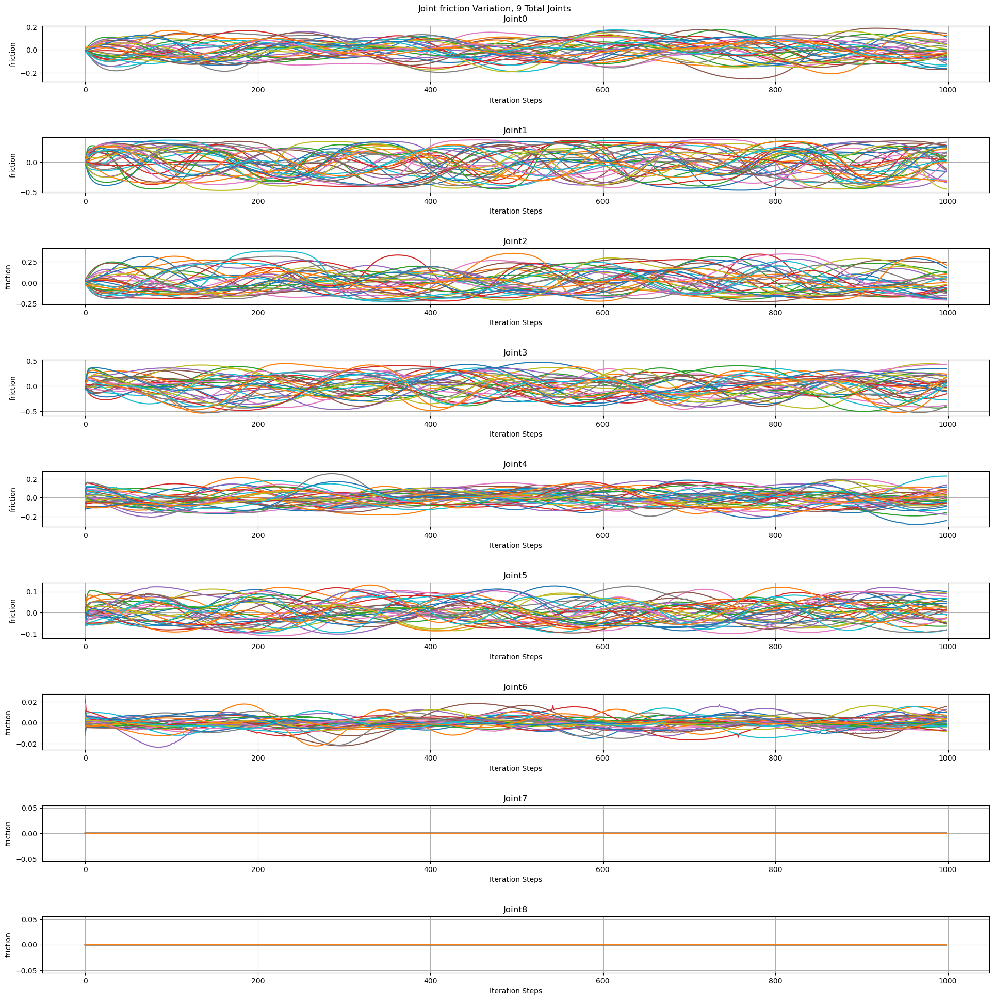

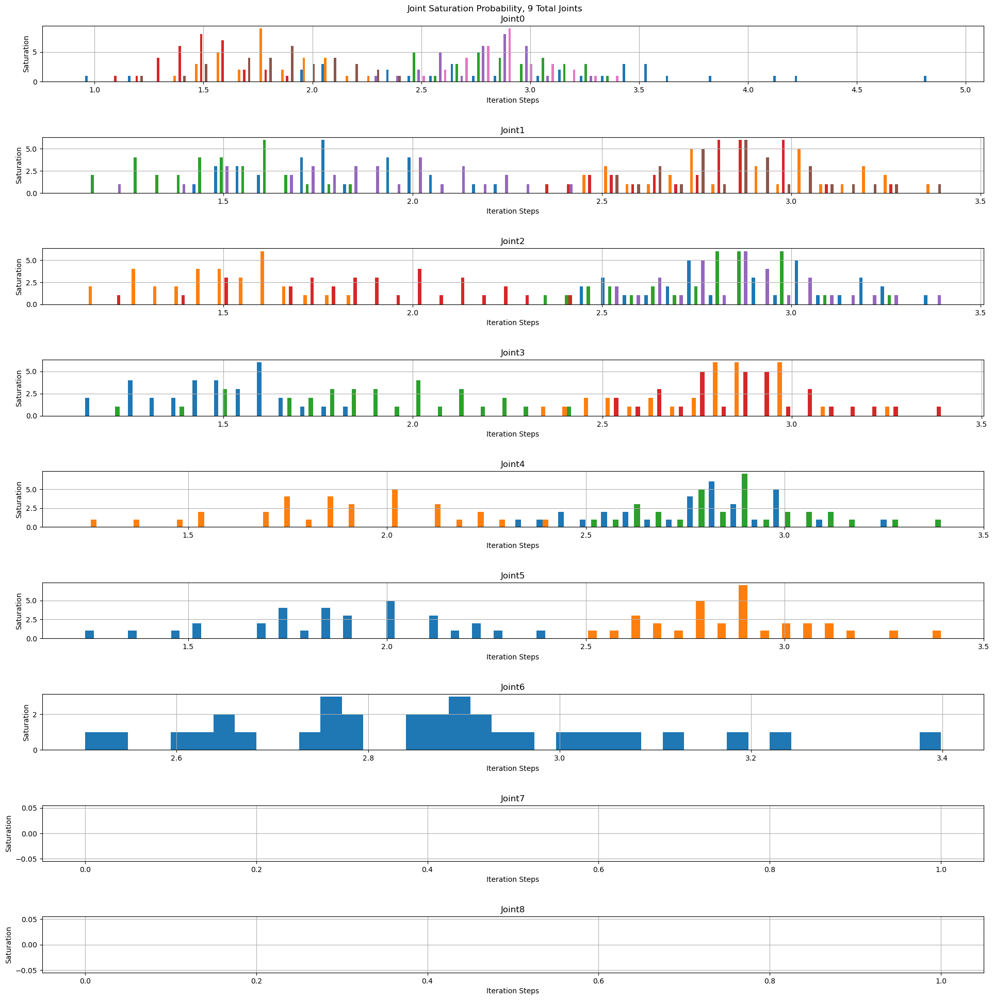

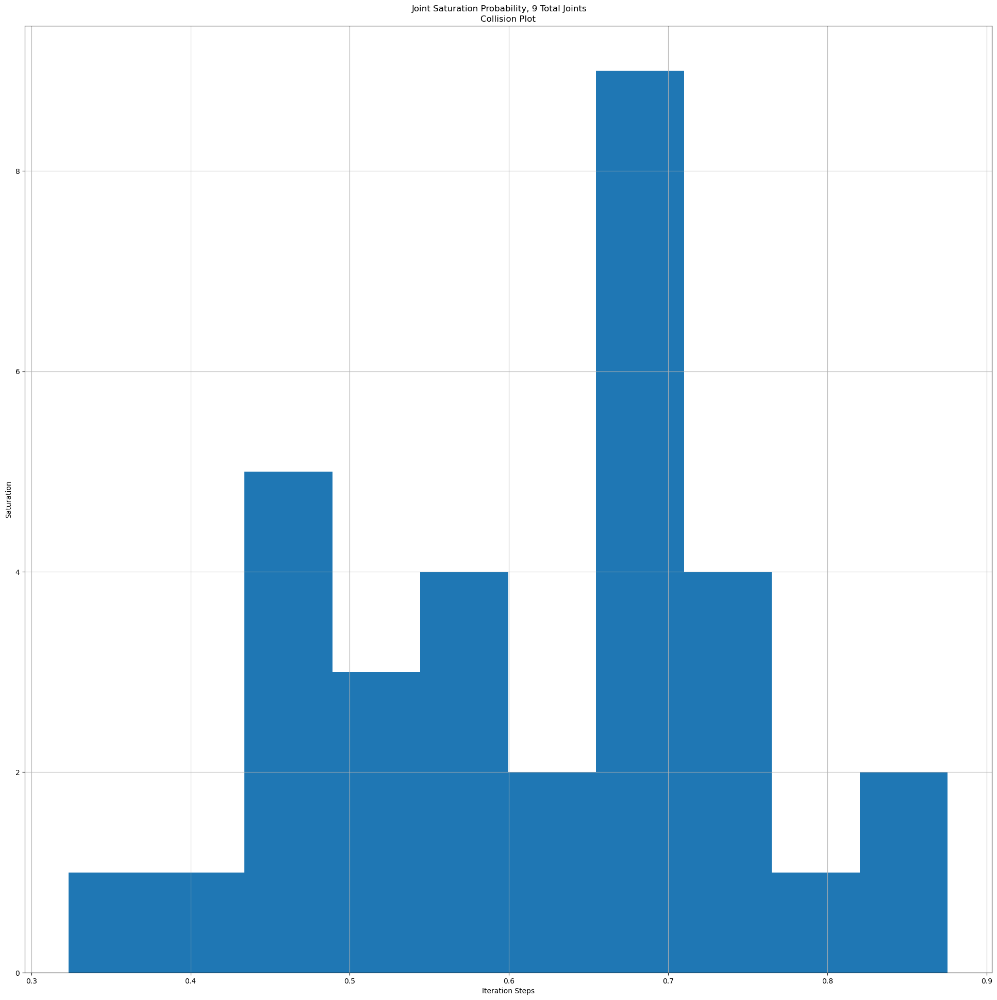

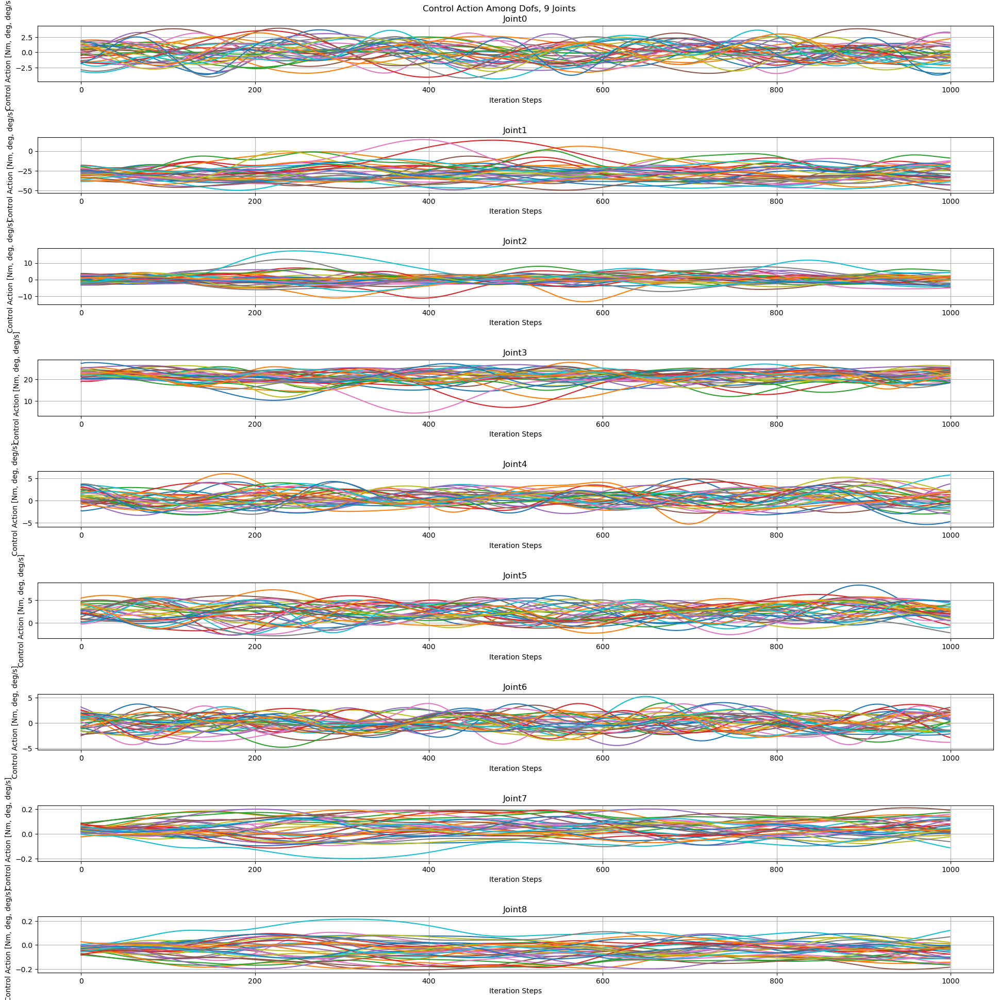

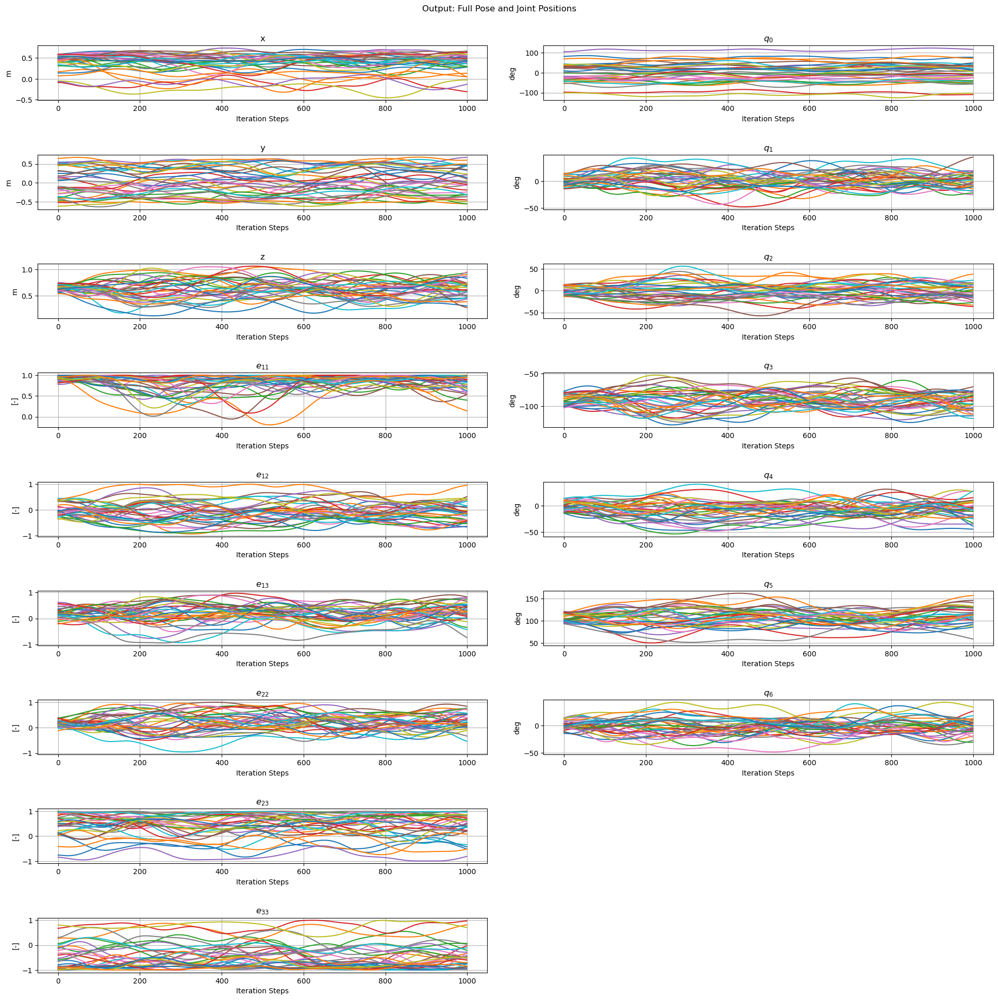

In [9]:
if not NOPLOT:
    dataprocessor = postprocessor(TOTAL_JOINTS,
                                TOTAL_COORDS,
                                args,
                                control_trajectory=cdict["bca"],
                                pose=cdict["bp"],
                                seed=generated_seed,
                                valid_envs=num_valid_envs,
                                target=cdict["bt"],
                                dynamical_inclusion=envdict["mv"]
                                )
    if DYNAMICAL_INCLUSION:
        dataprocessor.plot_linkmassdist()
    if MEASURE:
        dataprocessor.plot_secondary_var(var=torch.permute(cdict["mt"],(1,2,0)),varname="ground-truth control")
        dataprocessor.plot_secondary_var(var=torch.permute(cdiff,(1,2,0)),varname="benchmark control error")
    if HOLDFG:
        dataprocessor.plot_secondary_var(var=cdict["bg"],varname="gravity")
        dataprocessor.plot_secondary_var(var=cdict["bf"],varname="friction")
    if INCLUDE_SATURATION:
        dataprocessor.plot_saturation_histogram(pose=cdict["bp"],limits=[ll,ul])
        dataprocessor.plot_collision_histogram(pose=cdict["bp"])
    dataprocessor.plot_control()
    dataprocessor.plot_trajectory()
    #dataprocessor.plot_secondary_var(var=torch.permute(cdict["bp"],(1,2,0))[:,:,3:9],varname="dof velocity")
else:
    print("Input/Output Plots are not generated")


# REMARKS ABOUT DATAGENERATION
***
* Friction could be critical and friction imposition through dof_prop damping could be detrimental in the training phase and the eventual sim2real applications

* 6D orientation vectors could be much more easier to implement and train on

* Difference between ground truth and imposed control is weird, this difference is not due to damping not stiffness and reveals there is some internal computation isaacgym does which the user may not acces

* Saturation and collision histograms may be developed to refine the bounds of position and velocity randomization

* Mass tracking (dynamical inclusion) and velocity tracking are squeezed due to computational and space limitations

* Frequency range greatly effect simulation time - in the order of 10s

* Some large improvements in computational and space efficieny have been obtained with the new API - although not always
***

# QUESTIONS ABOUT DATAGENERATION
***
* how large should frequency range be for sim2real?

* is there any way to know the internal implementation of isaacgym controller dynamics

* can we use measured torques for sim2real?
***